In [1]:


!pip install --force-reinstall numpy==1.24.4


  Using cached numpy-1.24.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4


In [1]:
from ultralytics import YOLO
import os

def train_floor_model():
    # Get the current working directory (should be BlackSpot_FloorDetection)
    base_dir = os.getcwd()
    
    # Update the data.yaml file with correct paths
    data_yaml_content = f"""
path: {os.path.join(base_dir, 'data')}  # Base path to dataset
train: train/images  # Path to train images (relative to 'path')
val: valid/images    # Path to validation images (relative to 'path')
test: test/images    # Path to test images (relative to 'path')

nc: 1  # Number of classes
names: ['Floor']  # Class names

roboflow:
  workspace: ben-dover-wbbwh
  project: indoors
  version: 3
  license: CC BY 4.0
  url: https://universe.roboflow.com/ben-dover-wbbwh/indoors/dataset/3
"""
    # Write the updated yaml file
    with open(os.path.join('data', 'data.yaml'), 'w') as f:
        f.write(data_yaml_content)
    
    # Initialize the model
    model = YOLO('yolov8m.pt')  # Load the largest YOLOv8 model for best accuracy
    
    # Start training
    results = model.train(
        data=os.path.join('data', 'data.yaml'),
        epochs=100,
        imgsz=1024,
        batch=4,
        name='floor_detection',
        patience=20,
        optimizer='AdamW',
        lr0=0.0001,
        weight_decay=0.01,
        device=0  # Uses GPU
    )
    
    return model, results

if __name__ == "__main__":
    model, results = train_floor_model()

New https://pypi.org/project/ultralytics/8.3.68 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 2060 with Max-Q Design, 6144MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=data/data.yaml, epochs=100, time=None, patience=20, batch=4, imgsz=1024, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=floor_detection20, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=

train: Scanning /home/abheekp/BlackSpot_FloorDetection/data/train/labels.cache... 375 images, 0 backgrounds, 0 corrupt: 100%|████████

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 1298. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/home/abheekp/YoloV/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.22). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()

val: Scanning /home/abheekp/BlackSpot_FloorDetection/data/valid/labels.cache... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████|

numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.01), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 8 dataloader workers
Logging results to runs/detect/floor_detection20
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



     1/100      4.59G      1.572      2.791      1.807         23       1024:  41%|████▏     | 39/94 [00:21<00:30,  1.80it/s]

KeyboardInterrupt: 

In [3]:
best_model_path = os.path.join('runs', 'detect', 'floor_detection8', 'weights', 'best.pt')
model = YOLO(best_model_path)

# Now let's run comprehensive testing on our test dataset
print("Starting comprehensive model evaluation on test set...")
test_results = model.val(
    data=os.path.join('data', 'data.yaml'),
    split='test',            # Use the test split from our dataset
    imgsz=1024,             # Same image size as training
    batch=4,                # Batch size for testing
    verbose=True            # Print detailed results
)

# Let's save these test results in a clear format
test_metrics = {
    'mAP50': test_results.box.map50,      # Mean Average Precision at 50% IOU
    'mAP50-95': test_results.box.map,     # Mean Average Precision across IOUs
    'Precision': test_results.box.p,       # Overall precision
    'Recall': test_results.box.r          # Overall recall
}

# Create a formatted test report
print("\n" + "="*50)
print("FLOOR DETECTION MODEL TEST RESULTS")
print("="*50)
for metric_name, value in test_metrics.items():
    print(f"{metric_name}: {value:.4f}")
print("="*50)

# Save these metrics to a file for future reference
results_path = os.path.join('runs', 'detect', 'floor_detection8', 'test_results.txt')
with open(results_path, 'w') as f:
    f.write("Floor Detection Model Test Results\n")
    f.write(f"Test Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    for metric_name, value in test_metrics.items():
        f.write(f"{metric_name}: {value:.4f}\n")

print(f"\nTest results have been saved to: {results_path}")

Starting comprehensive model evaluation on test set...
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 2060 with Max-Q Design, 6144MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /home/abheekp/BlackSpot_FloorDetection/data/test/labels... 45 images, 0 backgrounds, 0 corrupt: 100%|██████████| 45/45 [00:00<00:00, 510.43it/s]

val: New cache created: /home/abheekp/BlackSpot_FloorDetection/data/test/labels.cache




                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:06<00:00,  1.86it/s]

                   all         45        128      0.956      0.711      0.779      0.674
Speed: 1.4ms preprocess, 87.9ms inference, 0.1ms loss, 12.0ms postprocess per image
Results saved to runs/detect/val

FLOOR DETECTION MODEL TEST RESULTS
mAP50: 0.7788
mAP50-95: 0.6738


TypeError: unsupported format string passed to numpy.ndarray.__format__

In [2]:
from ultralytics import YOLO
import cv2
import numpy as np
from PIL import Image

def run_inference(model_path, image_path):
    # Load the trained model
    model = YOLO(model_path)
    
    # Run inference on the image
    results = model.predict(
        source=image_path,
        conf=0.25,        # Confidence threshold
        iou=0.45,         # NMS IOU threshold
        imgsz=1024,       # Image size
        save=True         # Save results
    )[0]  # Get the first (and only) result
    
    # Load and process the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Draw the detections on the image
    for box in results.boxes:
        # Get box coordinates
        x1, y1, x2, y2 = box.xyxy[0] 
        conf = box.conf[0]
        cls = box.cls[0]
        
        # Convert coordinates to integers
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
        
        # Draw rectangle
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        # Add label
        label = f'Floor {conf:.2f}'
        cv2.putText(image, label, (x1, y1-10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
    
    # Convert back to BGR for saving
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    
    # Save the annotated image
    output_path = 'out.jpg'
    cv2.imwrite(output_path, image)
    
    print(f"Inference complete. Results saved to {output_path}")
    return results

# Usage
best_model_path = 'runs/detect/floor_detection8/weights/best.pt'
image_path = 'data/test/images/122_jpg.rf.d63fbd275f558bbf11a2190057a3b3c2.jpg'  

results = run_inference(best_model_path, image_path)

# Print detection results
print("\nDetection Results:")
print(f"Number of detections: {len(results.boxes)}")
for box in results.boxes:
    print(f"Confidence: {box.conf[0]:.4f}")
    print(f"Coordinates (xyxy): {box.xyxy[0].tolist()}")
    print("-" * 30)


image 1/1 /home/abheekp/BlackSpot_FloorDetection/data/test/images/122_jpg.rf.d63fbd275f558bbf11a2190057a3b3c2.jpg: 1024x1024 1 Floor, 65.2ms
Speed: 11.8ms preprocess, 65.2ms inference, 194.0ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/detect/predict16
Inference complete. Results saved to out.jpg

Detection Results:
Number of detections: 1
Confidence: 0.9089
Coordinates (xyxy): [50.70045471191406, 387.8633117675781, 640.0, 639.98828125]
------------------------------


In [76]:
!feh runs/detect/predict3/IMG20241209204235.jpg

In [1]:
from ultralytics import YOLO
import cv2
import numpy as np
from PIL import Image
import os

def run_inference_on_folder(model_path, input_folder):
    # Create embeddings folder if it doesn't exist
    embeddings_folder = 'embeddings'
    os.makedirs(embeddings_folder, exist_ok=True)
    
    # Load the trained model
    model = YOLO(model_path)
    
    # Get list of image files
    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        
        # Run inference on the image
        results = model.predict(
            source=image_path,
            conf=0.25,        # Confidence threshold
            iou=0.45,         # NMS IOU threshold
            imgsz=1024,       # Image size
            save=True         # Save results
        )[0]  # Get the first (and only) result
        
        # Load and process the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Draw the detections on the image
        for box in results.boxes:
            # Get box coordinates
            x1, y1, x2, y2 = box.xyxy[0]
            conf = box.conf[0]
            cls = box.cls[0]
            
            # Convert coordinates to integers
            x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
            
            # Draw rectangle
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            # Add label
            label = f'Floor {conf:.2f}'
            cv2.putText(image, label, (x1, y1-10), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
        
        # Convert back to BGR for saving
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        # Save the annotated image
        output_filename = f'annotated_{image_file}'
        output_path = os.path.join(embeddings_folder, output_filename)
        cv2.imwrite(output_path, image)
        
        # Save embeddings (features from the model)
        if hasattr(results, 'features'):
            embedding_filename = f'embedding_{os.path.splitext(image_file)[0]}.npy'
            embedding_path = os.path.join(embeddings_folder, embedding_filename)
            np.save(embedding_path, results.features)
        
        # Print detection results for each image
        print(f"\nProcessing: {image_file}")
        print(f"Number of detections: {len(results.boxes)}")
        for box in results.boxes:
            print(f"Confidence: {box.conf[0]:.4f}")
            print(f"Coordinates (xyxy): {box.xyxy[0].tolist()}")
            print("-" * 30)
    
    print(f"\nProcessing complete. Results saved in {embeddings_folder}/")

# Usage
best_model_path = 'runs/detect/floor_detection8/weights/best.pt'
input_folder = 'data/label'
run_inference_on_folder(best_model_path, input_folder)


image 1/1 /home/abheekp/BlackSpot_FloorDetection/data/label/22.png: 1024x1024 4 Floors, 67.6ms
Speed: 9.4ms preprocess, 67.6ms inference, 234.3ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/detect/predict14

Processing: 22.png
Number of detections: 4
Confidence: 0.8939
Coordinates (xyxy): [0.0, 604.1170654296875, 942.0123291015625, 1022.8135986328125]
------------------------------
Confidence: 0.8767
Coordinates (xyxy): [982.4033203125, 553.0, 1012.364013671875, 569.207763671875]
------------------------------
Confidence: 0.6190
Coordinates (xyxy): [197.122314453125, 545.6564331054688, 1024.0, 676.4004516601562]
------------------------------
Confidence: 0.2790
Coordinates (xyxy): [1011.410400390625, 547.525390625, 1023.959228515625, 600.455322265625]
------------------------------

image 1/1 /home/abheekp/BlackSpot_FloorDetection/data/label/26.png: 1024x1024 (no detections), 71.2ms
Speed: 5.3ms preprocess, 71.2ms inference, 1.1ms postprocess per image at s

In [87]:
from PIL import Image
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
img=Image.open('out.jpg','r')
img.show()

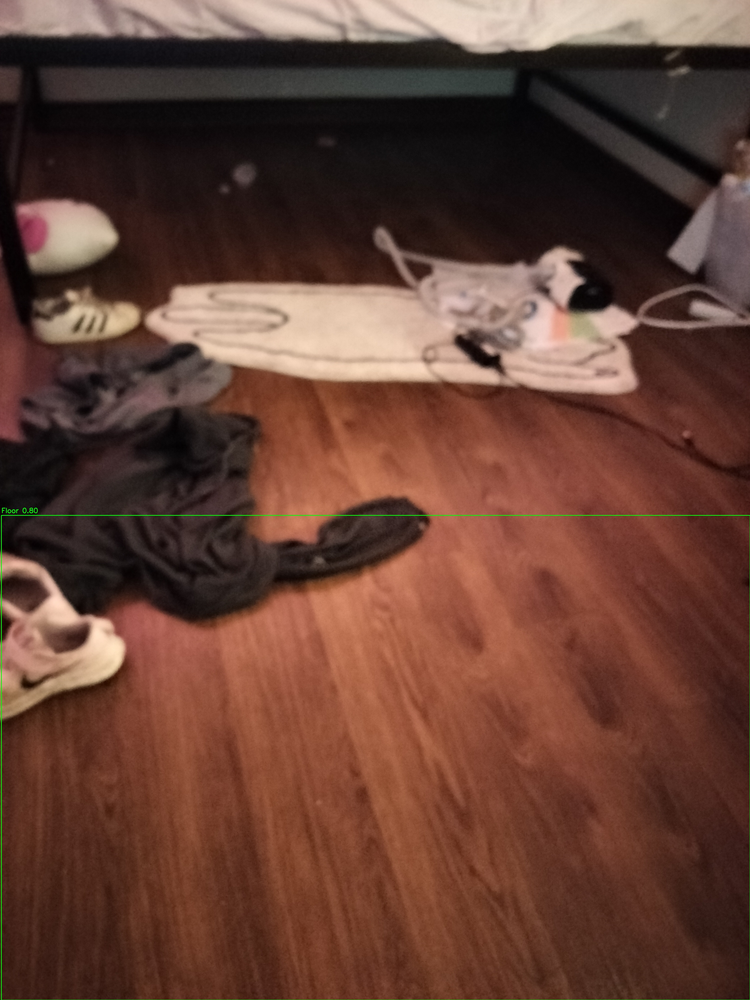

In [88]:
from PIL import Image               # to load images
from IPython.display import display # to display images

pil_im = Image.open('out.jpg')
display(pil_im)

In [2]:
import cv2
import numpy as np
import os

def preprocess_image(image_path):
    # Read image
    img = cv2.imread(image_path)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Apply contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    
    # Apply thresholding to identify dark regions
    _, thresh = cv2.threshold(enhanced, 50, 255, cv2.THRESH_BINARY_INV)
    
    # Remove noise
    kernel = np.ones((3,3), np.uint8)
    cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    
    return cleaned

def process_folder():
    # Create cleaned folder if it doesn't exist
    cleaned_folder = 'cleaned'
    os.makedirs(cleaned_folder, exist_ok=True)
    
    # Get list of images from embeddings folder
    embeddings_folder = 'data/embeddings'
    image_files = [f for f in os.listdir(embeddings_folder) 
                  if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    # Process each image
    for image_file in image_files:
        # Construct full paths
        input_path = os.path.join(embeddings_folder, image_file)
        output_path = os.path.join(cleaned_folder, f'cleaned_{image_file}')
        
        # Process the image
        cleaned_image = preprocess_image(input_path)
        
        # Save the cleaned image
        cv2.imwrite(output_path, cleaned_image)
        
        print(f"Processed: {image_file}")
    
    print(f"\nAll images processed. Cleaned images saved in {cleaned_folder}/")

# Run the processing
if __name__ == "__main__":
    process_folder()

Processed: annotated_1.png
Processed: annotated_28.png
Processed: annotated_13.png
Processed: annotated_30.png
Processed: annotated_33.png
Processed: annotated_3.png
Processed: annotated_35.png
Processed: annotated_32.png
Processed: annotated_26.png
Processed: annotated_22.png
Processed: annotated_14.png
Processed: annotated_11.png
Processed: annotated_15.png
Processed: annotated_38.png
Processed: annotated_8.png
Processed: annotated_23.png
Processed: annotated_27.png
Processed: annotated_12.png
Processed: annotated_37.png
Processed: annotated_9.png
Processed: annotated_39.png
Processed: annotated_20.png
Processed: annotated_5.png
Processed: annotated_36.png
Processed: annotated_4.png
Processed: annotated_34.png
Processed: annotated_25.png
Processed: annotated_21.png
Processed: annotated_18.png
Processed: annotated_29.png
Processed: annotated_16.png
Processed: annotated_31.png
Processed: annotated_7.png
Processed: annotated_2.png
Processed: annotated_24.png
Processed: annotated_6.png
P

In [13]:
import cv2
import numpy as np
import os
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
from ultralytics import YOLO

class DarkSpotLabeler:
    def __init__(self, floor_model_path):
        # Load floor detection model
        self.floor_model = YOLO(floor_model_path)
        
        # Initialize the main window
        self.root = tk.Tk()
        self.root.title("Dark Spot Labeling Tool (Floor-Constrained)")
        
        # Set up the canvas
        self.canvas_width = 1024
        self.canvas_height = 1024
        self.canvas = tk.Canvas(self.root, width=self.canvas_width, height=self.canvas_height)
        self.canvas.pack(side=tk.LEFT)
        
        # Control panel
        self.control_panel = tk.Frame(self.root)
        self.control_panel.pack(side=tk.RIGHT, fill=tk.Y)
        
        # Buttons
        tk.Button(self.control_panel, text="Load Directory", command=self.load_directory).pack(pady=5)
        tk.Button(self.control_panel, text="Next Image", command=self.next_image).pack(pady=5)
        tk.Button(self.control_panel, text="Previous Image", command=self.prev_image).pack(pady=5)
        tk.Button(self.control_panel, text="Save Labels", command=self.save_current_labels).pack(pady=5)
        tk.Button(self.control_panel, text="Delete Last Box", command=self.delete_last_box).pack(pady=5)
        
        # Status labels
        self.status_var = tk.StringVar()
        self.status_var.set("No image loaded")
        tk.Label(self.control_panel, textvariable=self.status_var).pack(pady=5)
        
        self.floor_status_var = tk.StringVar()
        self.floor_status_var.set("No floor detected")
        tk.Label(self.control_panel, textvariable=self.floor_status_var).pack(pady=5)
        
        # Initialize variables
        self.current_image = None
        self.image_paths = []
        self.current_index = -1
        self.current_boxes = []
        self.floor_boxes = []
        self.drawing = False
        self.start_x = None
        self.start_y = None
        
        # Bind mouse events
        self.canvas.bind("<ButtonPress-1>", self.start_box)
        self.canvas.bind("<B1-Motion>", self.draw_box)
        self.canvas.bind("<ButtonRelease-1>", self.end_box)

    def detect_floor(self, image_path):
        results = self.floor_model.predict(
            source=image_path,
            conf=0.25,
            iou=0.45,
            imgsz=1024
        )[0]
        
        self.floor_boxes = []
        for box in results.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = float(box.conf[0])
            self.floor_boxes.append((x1, y1, x2, y2, conf))
        
        self.floor_status_var.set(f"Detected {len(self.floor_boxes)} floor regions")
        return self.floor_boxes

    def is_point_in_floor(self, x, y):
        for x1, y1, x2, y2, _ in self.floor_boxes:
            if x1 <= x <= x2 and y1 <= y <= y2:
                return True
        return False

    def load_directory(self):
        directory = filedialog.askdirectory()
        if directory:
            self.image_paths = [
                os.path.join(directory, f) for f in os.listdir(directory)
                if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            ]
            self.current_index = -1
            self.next_image()

    def load_image(self):
        if 0 <= self.current_index < len(self.image_paths):
            image_path = self.image_paths[self.current_index]
            
            # Load and detect floor regions
            self.floor_boxes = self.detect_floor(image_path)
            
            # Load image
            self.current_image = cv2.imread(image_path)
            self.current_image = cv2.cvtColor(self.current_image, cv2.COLOR_BGR2RGB)
            
            # Convert to PhotoImage
            image = Image.fromarray(self.current_image)
            self.tk_image = ImageTk.PhotoImage(image)
            
            # Update canvas
            self.canvas.delete("all")
            self.canvas.create_image(0, 0, anchor=tk.NW, image=self.tk_image)
            
            # Draw floor regions
            for x1, y1, x2, y2, conf in self.floor_boxes:
                self.canvas.create_rectangle(x1, y1, x2, y2, outline="blue", tags="floor")
            
            # Load existing dark spot labels
            self.load_existing_labels()
            
            # Update status
            self.status_var.set(f"Image {self.current_index + 1}/{len(self.image_paths)}")

    def start_box(self, event):
        if self.is_point_in_floor(event.x, event.y):
            self.drawing = True
            self.start_x = event.x
            self.start_y = event.y
        else:
            self.status_var.set("Can only label within floor regions")

    def draw_box(self, event):
        if self.drawing:
            self.canvas.delete("temp_box")
            self.canvas.create_rectangle(
                self.start_x, self.start_y,
                event.x, event.y,
                outline="red", tags="temp_box"
            )

    def end_box(self, event):
        if self.drawing:
            self.drawing = False
            if self.is_point_in_floor(event.x, event.y):
                # Convert to YOLO format
                img_height, img_width = self.current_image.shape[:2]
                x_center = (self.start_x + event.x) / (2 * img_width)
                y_center = (self.start_y + event.y) / (2 * img_height)
                width = abs(event.x - self.start_x) / img_width
                height = abs(event.y - self.start_y) / img_height
                
                # Add box (class 1 for dark spot)
                self.current_boxes.append([1, x_center, y_center, width, height])
                self.draw_saved_boxes()
            else:
                self.status_var.set("Box must end within floor region")

    def draw_saved_boxes(self):
        self.canvas.delete("saved_box")
        img_height, img_width = self.current_image.shape[:2]
        
        for box in self.current_boxes:
            _, x_center, y_center, width, height = box
            x1 = int((x_center - width/2) * img_width)
            y1 = int((y_center - height/2) * img_height)
            x2 = int((x_center + width/2) * img_width)
            y2 = int((y_center + height/2) * img_height)
            
            self.canvas.create_rectangle(x1, y1, x2, y2, outline="red", tags="saved_box")

    def save_current_labels(self):
        if self.current_index >= 0:
            image_path = self.image_paths[self.current_index]
            label_path = image_path.rsplit('.', 1)[0] + '.txt'
            
            with open(label_path, 'w') as f:
                # Save floor regions (class 0)
                for x1, y1, x2, y2, _ in self.floor_boxes:
                    img_height, img_width = self.current_image.shape[:2]
                    x_center = (x1 + x2) / (2 * img_width)
                    y_center = (y1 + y2) / (2 * img_height)
                    width = (x2 - x1) / img_width
                    height = (y2 - y1) / img_height
                    f.write(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")
                
                # Save dark spot boxes (class 1)
                for box in self.current_boxes:
                    f.write(f"{box[0]} {box[1]:.6f} {box[2]:.6f} {box[3]:.6f} {box[4]:.6f}\n")

    def load_existing_labels(self):
        image_path = self.image_paths[self.current_index]
        label_path = image_path.rsplit('.', 1)[0] + '.txt'
        
        self.current_boxes = []
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    class_id, x_center, y_center, width, height = map(float, line.strip().split())
                    if class_id == 1:  # Only load dark spot boxes
                        self.current_boxes.append([int(class_id), x_center, y_center, width, height])
            self.draw_saved_boxes()

    def delete_last_box(self):
        if self.current_boxes:
            self.current_boxes.pop()
            self.draw_saved_boxes()

    def next_image(self):
        if self.current_index < len(self.image_paths) - 1:
            self.save_current_labels()
            self.current_index += 1
            self.current_boxes = []
            self.load_image()

    def prev_image(self):
        if self.current_index > 0:
            self.save_current_labels()
            self.current_index -= 1
            self.current_boxes = []
            self.load_image()

    def run(self):
        self.root.mainloop()

if __name__ == "__main__":
    floor_model_path = 'runs/detect/floor_detection8/weights/best.pt'
    labeler = DarkSpotLabeler(floor_model_path)
    
    # Automatically load the embeddings folder
    labeler.image_paths = [
        os.path.join('data/embeddings', f) 
        for f in os.listdir('data/embeddings') 
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ]
    labeler.current_index = -1
    labeler.next_image()
    
    labeler.run()

TclError: couldn't connect to display "172.21.64.1:0"

In [15]:
!export $DISPLAY=:0
!echo $DISPLAY

/bin/bash: line 1: export: `172.21.64.1:0=:0': not a valid identifier
172.21.64.1:0


In [2]:
import os
import cv2
import numpy as np
from ultralytics import YOLO
from pathlib import Path

class FloorSegmentExtractor:
    def __init__(self, model_path, confidence_threshold=0.25):
        """Initialize the floor segment extractor with the trained model.
        
        Args:
            model_path: Path to the trained YOLOv8 floor detection model
            confidence_threshold: Minimum confidence score for floor detections
        """
        self.model = YOLO(model_path)
        self.conf_threshold = confidence_threshold
        
    def process_image(self, image_path, output_dir):
        """Process a single image and extract floor segments.
        
        Args:
            image_path: Path to the input image
            output_dir: Directory to save the extracted floor segments
        """
        # Read the image
        image = cv2.imread(str(image_path))
        if image is None:
            print(f"Warning: Could not read image {image_path}")
            return
        
        # Get original image dimensions
        height, width = image.shape[:2]
        
        # Run floor detection
        results = self.model.predict(
            source=image_path,
            conf=self.conf_threshold,
            save=False
        )[0]
        
        # Process each detected floor region
        for idx, box in enumerate(results.boxes):
            # Get coordinates and confidence
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = float(box.conf[0])
            
            # Add small padding to avoid cutting off edges
            padding = 5
            x1 = max(0, x1 - padding)
            y1 = max(0, y1 - padding)
            x2 = min(width, x2 + padding)
            y2 = min(height, y2 + padding)
            
            # Crop the floor segment
            floor_segment = image[y1:y2, x1:x2]
            
            # Create filename for the segment
            base_name = Path(image_path).stem
            segment_name = f"{base_name}_floor_{idx}_conf_{conf:.2f}.jpg"
            output_path = os.path.join(output_dir, segment_name)
            
            # Save the segment
            cv2.imwrite(output_path, floor_segment)
            
            print(f"Saved floor segment {idx+1} from {base_name} "
                  f"(confidence: {conf:.2f}) to {segment_name}")
    
    def process_directory(self, input_dir, output_dir):
        """Process all images in a directory and extract floor segments.
        
        Args:
            input_dir: Directory containing input images
            output_dir: Directory to save extracted floor segments
        """
        # Create output directory if it doesn't exist
        os.makedirs(output_dir, exist_ok=True)
        
        # Get list of image files
        input_dir = Path(input_dir)
        image_files = list(input_dir.glob('*.jpg')) + \
                     list(input_dir.glob('*.png')) + \
                     list(input_dir.glob('*.jpeg'))
        
        print(f"Found {len(image_files)} images to process")
        
        # Process each image
        for img_path in image_files:
            print(f"\nProcessing {img_path.name}...")
            self.process_image(img_path, output_dir)

def main():
    # Initialize the extractor with your trained model
    model_path = 'runs/detect/floor_detection8/weights/best.pt'
    extractor = FloorSegmentExtractor(model_path)
    
    # Set up input and output directories
    input_dir = 'data/label'  # Directory containing your images
    output_dir = 'floor_segmented'  # Directory to save floor segments
    
    # Process all images
    extractor.process_directory(input_dir, output_dir)
    
    print("\nProcessing complete!")
    print(f"Floor segments have been saved to: {output_dir}/")

if __name__ == "__main__":
    main()

Found 375 images to process
Target size for all segments: (640, 640)

Processing 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965.jpg...

image 1/1 /home/abheekp/BlackSpot_FloorDetection/data/train/images/85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965.jpg: 1024x1024 4 Floors, 57.0ms
Speed: 6.1ms preprocess, 57.0ms inference, 3.6ms postprocess per image at shape (1, 3, 1024, 1024)
Saved normalized floor segment 1 from 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965 (confidence: 0.93) to 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965_floor_0_conf_0.93.jpg
Saved normalized floor segment 2 from 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965 (confidence: 0.93) to 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965_floor_1_conf_0.93.jpg
Saved normalized floor segment 3 from 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965 (confidence: 0.88) to 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965_floor_2_conf_0.88.jpg
Saved normalized floor segment 4 from 85_jpg.rf.f0cea275ecd50a2d8102fbc385a0d965 (confidence: 0.86) to 85_jpg.rf.f0cea275ec